<a href="https://colab.research.google.com/github/giorgiosld/Natural-Language-Processing/blob/main/labs/lab6/T_725_Lab06.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# T-725 Natural Language Processing: Lab 6
In today's lab, we will be working with the SHAP and Transformers libraries for explainability and debugging bias.

To begin with, do the following:
* Select `"File" > "Save a copy in Drive"` to create a local copy of this notebook that you can edit.
* **Select `"Runtime" > "Change runtime type"`, and make sure that you have "Hardware accelerator" set to "GPU"**

All examples are taken from the [SHAP](https://shap.readthedocs.io/en/stable/index.html) website.

Install the required libraries and then **restart the runtime**:


In [1]:
!pip install transformers

In [2]:
!pip install shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 12.3 MB/s eta 0:00:00


In [3]:
!pip install datasets

INFO: pip is looking at multiple versions of multiprocess to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 471.6/471.6 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 11.0 MB/s eta 0:00:00


In [4]:
!pip install sentencepiece

##SHAP
SHAP (SHapley Additive exPlanations) is a game theoretic approach to explain the output of any machine learning model. It connects optimal credit allocation with local explanations using the classic Shapley values from game theory and their related extensions (see [papers](https://github.com/slundberg/shap#citations) for details and citations).

The Shapley value provides a principled way to explain the predictions of nonlinear models common in the field of machine learning. By interpreting a model trained on a set of features as a value function on a coalition of players, Shapley values provide a natural way to compute which features contribute to a prediction.

The Shapley value is a solution concept in cooperative game theory and characterized by a collection of desirable properties.

The setup is as follows: a coalition of players cooperates, and obtains a certain overall gain from that cooperation. Since some players may contribute more to the coalition than others or may possess different bargaining power (for example threatening to destroy the whole surplus), what final distribution of generated surplus among the players should arise in any particular game? Or phrased differently: how important is each player to the overall cooperation, and what payoff can he or she reasonably expect? The Shapley value provides one possible answer to this question.

##Emotion classification multiclass example

This section demonstrates how to use the `Partition` explainer for a multiclass text classification scenario. Once the SHAP values are computed for a set of sentences we then visualize feature attributions towards individual classes. The text classifcation model we use is BERT fine-tuned on an emotion dataset to classify a sentence among six classes: *joy*, *sadness*, *anger*, *fear*, *love* and *surprise*.

In [5]:
import pandas as pd
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import torch
import transformers
import datasets
import shap

In [6]:
# load the emotion dataset
dataset  = datasets.load_dataset("emotion", split = "train")
data = pd.DataFrame({'text':dataset['text'],'emotion':dataset['label']})

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/9.05k [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/1.03M [00:00<?, ?B/s]

validation-00000-of-00001.parquet:   0%|          | 0.00/127k [00:00<?, ?B/s]

test-00000-of-00001.parquet:   0%|          | 0.00/129k [00:00<?, ?B/s]

Generating train split:   0%|          | 0/16000 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/2000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/2000 [00:00<?, ? examples/s]

###Build a transformers pipline

Note that we have set `return_all_scores=True` for the pipeline so we can observe the model's behavior for all classes, not just the top output.

In [7]:
# load the model and tokenizer
tokenizer = transformers.AutoTokenizer.from_pretrained("nateraw/bert-base-uncased-emotion", use_fast=True)
emotion_model = transformers.AutoModelForSequenceClassification.from_pretrained("nateraw/bert-base-uncased-emotion").cuda()

# build a pipeline object to do predictions
pred = transformers.pipeline("text-classification", model=emotion_model, tokenizer=tokenizer, device=0, return_all_scores=True)

tokenizer_config.json:   0%|          | 0.00/252 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/768 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


pytorch_model.bin:   0%|          | 0.00/438M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/pipelines/text_classification.py:104: UserWarning: `return_all_scores` is now deprecated,  if want a similar functionality use `top_k=None` instead of `return_all_scores=True` or `top_k=1` instead of `return_all_scores=False`.
  warnings.warn(


###Create an explainer for the pipeline

A transformers `pipeline` object can be passed directly to `shap.Explainer`, which will then wrap the pipeline model as a `shap.models.TransformersPipeline` model and the pipeline tokenizer as a `shap.maskers.Text masker`.

In [8]:
explainer = shap.Explainer(pred)

###Compute SHAP values

Explainers have the same method signature as the models they are explaining, so we just pass a list of strings for which to explain the classifications.

In [9]:
shap_values = explainer(data['text'][:3])

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
PartitionExplainer explainer: 4it [00:10, 10.60s/it]               


###Visualize the impact on all the output classes

In the plots below, when you hover your mouse over an output class you get the explanation for that output class. When you click an output class name then that class remains the focus of the explanation visualization until you click another class.

The base value is what the model outputs when the entire input text is masked, while $f_{outputclass}=(inputs)$
is the output of the model for the full original input. The SHAP values explain in an addive way how the impact of unmasking each word changes the model output from the base value (where the entire input is masked) to the final prediction value.

In [10]:
shap.plots.text(shap_values)

###Visualize the impact on a single class

Since `Explanation` objects are sliceable we can slice out just a single output class to visualize the model output towards that class.

In [11]:
shap.plots.text(shap_values[:, :, "anger"])

###Plotting the top words impacting a specific class

In addition to slicing, `Explanation` objects also support a set of reducing methods. Here we use the `.mean(0)` to take the average impact of all words towards the “joy” class. Note that here we are also averaging over three examples, to get a better summary you would want to use a larger portion of the dataset.

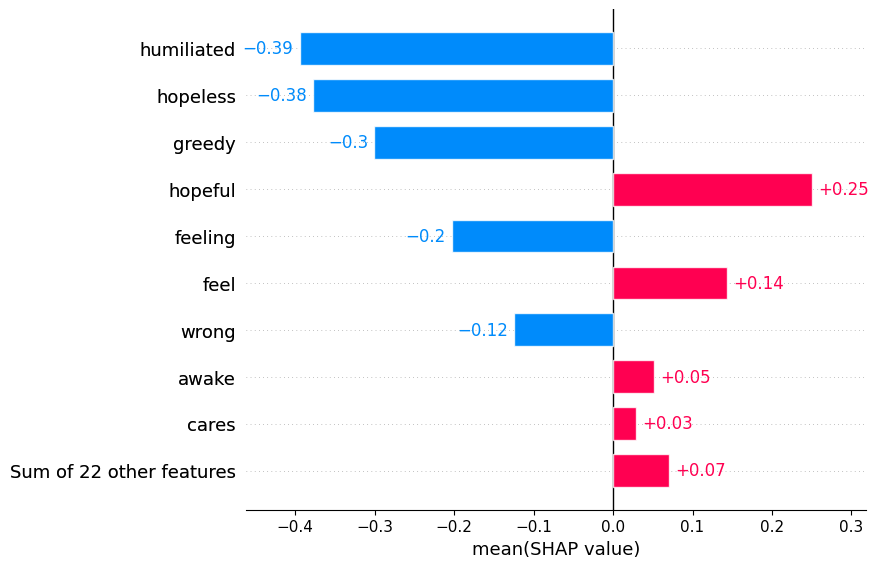

In [12]:
shap.plots.bar(shap_values[:,:,"joy"].mean(0))

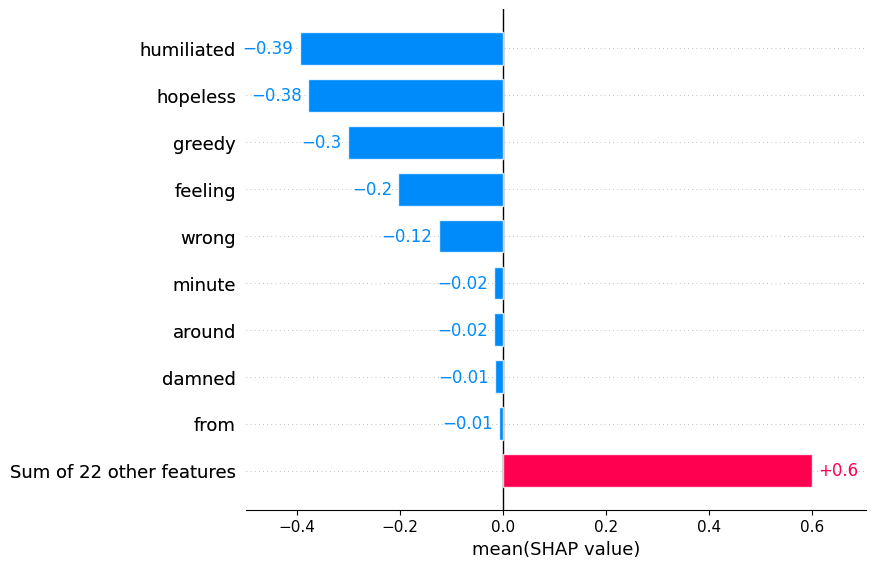

In [13]:
# we can sort the bar chart in decending order
shap.plots.bar(shap_values[:,:,"joy"].mean(0), order=shap.Explanation.argsort)

##Machine Translation Explanations
This section demonstrates model explanations for a text to text scenario using a pretrained transformer model for machine translation. In this demo, we showcase explanations on a model for [English to French](https://huggingface.co/Helsinki-NLP/opus-mt-en-fr).

In [14]:
import numpy as np
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
import shap
import torch

In [15]:
tokenizer = AutoTokenizer.from_pretrained("Helsinki-NLP/opus-mt-en-fr")
translation_model = AutoModelForSeq2SeqLM.from_pretrained("Helsinki-NLP/opus-mt-en-fr")

tokenizer_config.json:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.42k [00:00<?, ?B/s]

source.spm:   0%|          | 0.00/778k [00:00<?, ?B/s]

target.spm:   0%|          | 0.00/802k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.34M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/marian/tokenization_marian.py:175: UserWarning: Recommended: pip install sacremoses.
  warnings.warn("Recommended: pip install sacremoses.")
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


pytorch_model.bin:   0%|          | 0.00/301M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/293 [00:00<?, ?B/s]

In [16]:
data = [
    "Transformers have rapidly become the model of choice for NLP problems, replacing older recurrent neural network models"
]

In [17]:
explainer = shap.Explainer(translation_model, tokenizer)
shap_values = explainer(data)

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:49, 49.59s/it]               


In [18]:
shap.plots.text(shap_values)

Note that we can do the same thing with other languages. The [Helsinki NLP](https://huggingface.co/Helsinki-NLP) group, for example, has models in multiple other languages you can try out, such as for Icelandic to English (Helsinki-NLP/opus-mt-is-en) and vice versa (Helsinki-NLP/opus-mt-en-is).

##Open Ended GPT2 Text Generation Explanations
This section shows how to get explanations for the output of GPT2 used for open ended text generation. In this demo, we use the pretrained GPT2 model provided by [Hugging Face](https://huggingface.co/gpt2) to explain the generated text by GPT2. We further showcase how to get explanations for custom output generated text and plot global input token importances for any output generated token.

In [19]:
import numpy as np
from transformers import AutoTokenizer, AutoModelForCausalLM
import shap
import torch

In [20]:
tokenizer = AutoTokenizer.from_pretrained("gpt2", use_fast=True)
nlg_model = AutoModelForCausalLM.from_pretrained("gpt2")

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

Below, we set certain model configurations. We need to define if the model is a decoder or encoder-decoder. This can be set through the ‘is_decoder’ or ‘is_encoder_decoder’ param in model’s config file. We can also set custom model generation parameters which will be used during the output text generation decoding process.

In [21]:
# set model decoder to true
nlg_model.config.is_decoder=True
# set text-generation params under task_specific_params
nlg_model.config.task_specific_params["text-generation"] = {
    "do_sample": True,
    "max_length": 50,
    "temperature": 0.7,
    "top_k": 50,
    "no_repeat_ngram_size": 2
}

Define initial text:

In [22]:
s = ['I enjoy walking with my cute dog']

Create an explainer object and compute the SHAP values:

In [23]:
explainer = shap.Explainer(nlg_model, tokenizer)
shap_values = explainer(s)

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1258: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Visualize shap explanations:

In [24]:
shap.plots.text(shap_values)

###Custom text generation and debugging biased outputs
Below we demonstrate the process of how to explain the liklihood of generating a particular output sentence given an input sentence using the model. For example, we ask a question: Which country's inhabitant (target) in the sentence "I know many people who are [target]." would have a high liklilhood of generating the token "vodka" in the output sentence "They love their vodka!"? For this, we first define input-output sentence pairs

In [25]:
# define input
x = [
    "I know many people who are Finnish.",
    "I know many people who are Greek.",
    "I know many people who are Australian.",
    "I know many people who are American.",
    "I know many people who are Italian.",
    "I know many people who are Spanish.",
    "I know many people who are German.",
    "I know many people who are Indian."
]

In [26]:
# define output
y = [
    "They love their vodka!",
    "They love their vodka!",
    "They love their vodka!",
    "They love their vodka!",
    "They love their vodka!",
    "They love their vodka!",
    "They love their vodka!",
    "They love their vodka!"
]

We wrap the model with a Teacher Forcing scoring class and create a Text masker:

In [27]:
teacher_forcing_model = shap.models.TeacherForcing(nlg_model, tokenizer)
masker = shap.maskers.Text(tokenizer, mask_token = "...", collapse_mask_token=True)

Create an explainer:

In [28]:
explainer = shap.Explainer(teacher_forcing_model, masker)

Generate SHAP explanation values:

In [29]:
shap_values = explainer(x, y)

PartitionExplainer explainer: 9it [00:24,  4.85s/it]


Now that we have generated the SHAP values, we can have a look at the contribution of tokens in the input driving the token "vodka" in the output sentence using the text plot. Just hover your mouse over "vodka" to see this for each example. You can also click on the word "vodka" to see this more clearsly.

Note: The red color indicates a positive contribution while the blue color indicates negative contribution and the intensity of the color shows its strength in the respective direction.

In [30]:
shap.plots.text(shap_values)

That's it! Now you can gain better insight into your models using SHAP 😀

##Assignment

Complete the following questions and hand in your solution in Canvas before 23:59 Friday, October 4th. Remember to save your file before uploading it.

##Part 1

Visualize the relation of the input to the emotions.

Which words impact each class the most?

In [31]:
green_mile = ["","""
I want it over and done. I do. I'm tired, boss. Tired of bein' on the road, lonely
as a sparrow in the rain. Tired of not ever having me a buddy to be with, or tell
me where we's coming from or going to, or why. Mostly I'm tired of people being
ugly to each other. I'm tired of all the pain I feel and hear in the world everyday.
There's too much of it. It's like pieces of glass in my head all the time. Can you
understand?
""",""]

In [32]:
# Your solution here

##Part 2

Visualize the explanations for machine translation models for two languages you speak or have the best knowledge of. Try running this for three different sentences.

Does the output sequence correlate with the input sequence in a way you would have expected?

In [33]:
# Your solution here

##Part 3

Use the method to debug biased output on a different kind of bias. For example, gender bias related to professions like doctors.

Try one more example of your choosing.

In [34]:
# Solution to gender bias

In [35]:
# Solution to your own example